In [1]:
#requrements libs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
##to read csv    


df= pd.read_csv("1.csv")

df.head()


,Url,bathroom_count,bedroom_count,construction_year,country,district,garden,garden_area,kitchen,living_area,...,region,subtype_of_property,surface_of_plot,swimming_pool,terrace,toilet_count,type_of_property,type_of_sale,PEB_grade,Building_state_grade
0,https://www.immoweb.be/en/classified/apartment...,1,1,1969.0,Belgium,Brugge,NaN,NaN,NaN,29.0,...,Flanders,flat_studio,29.0,0.0,1.0,1.0,2,residential_sale,5,4
1,https://www.immoweb.be/en/classified/house/for...,6,13,1920.0,Belgium,Tournai,NaN,NaN,NaN,391.0,...,Wallonie,apartment_block,130.0,0.0,NaN,5.0,1,residential_sale,4,4
2,https://www.immoweb.be/en/classified/house/for...,2,4,2008.0,Belgium,Brugge,NaN,NaN,INSTALLED,111.0,...,Flanders,house,0.0,0.0,NaN,2.0,1,residential_sale,6,4
3,https://www.immoweb.be/en/classified/house/for...,1,4,1987.0,Belgium,Veurne,1.0,1.0,NaN,172.0,...,Flanders,house,170.0,0.0,1.0,2.0,1,residential_sale,2,3
4,https://www.immoweb.be/en/classified/apartment...,0,2,1972.0,Belgium,Hasselt,NaN,NaN,NaN,92.0,...,Flanders,apartment,92.0,0.0,1.0,1.0,2,residential_sale,6,6


In [3]:
df.groupby('district')['price'].sum().sort_values(ascending=False)

houses_counter_per_district = df.groupby('district').size().sort_values(ascending=False)

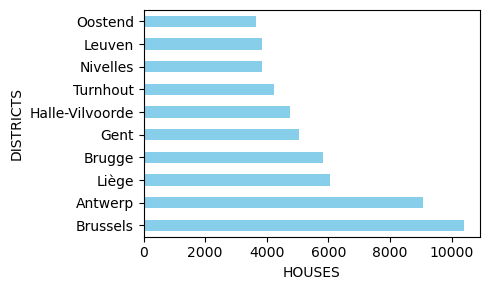

In [4]:
houses_counter_per_district = df.groupby('district').size().sort_values(ascending=False).head(10)


plt.figure(figsize=(5, 3))  
houses_counter_per_district.plot(kind='barh', color='skyblue') 
plt.xlabel('HOUSES') 
plt.ylabel('DISTRICTS') 
plt.tight_layout()
plt.show()


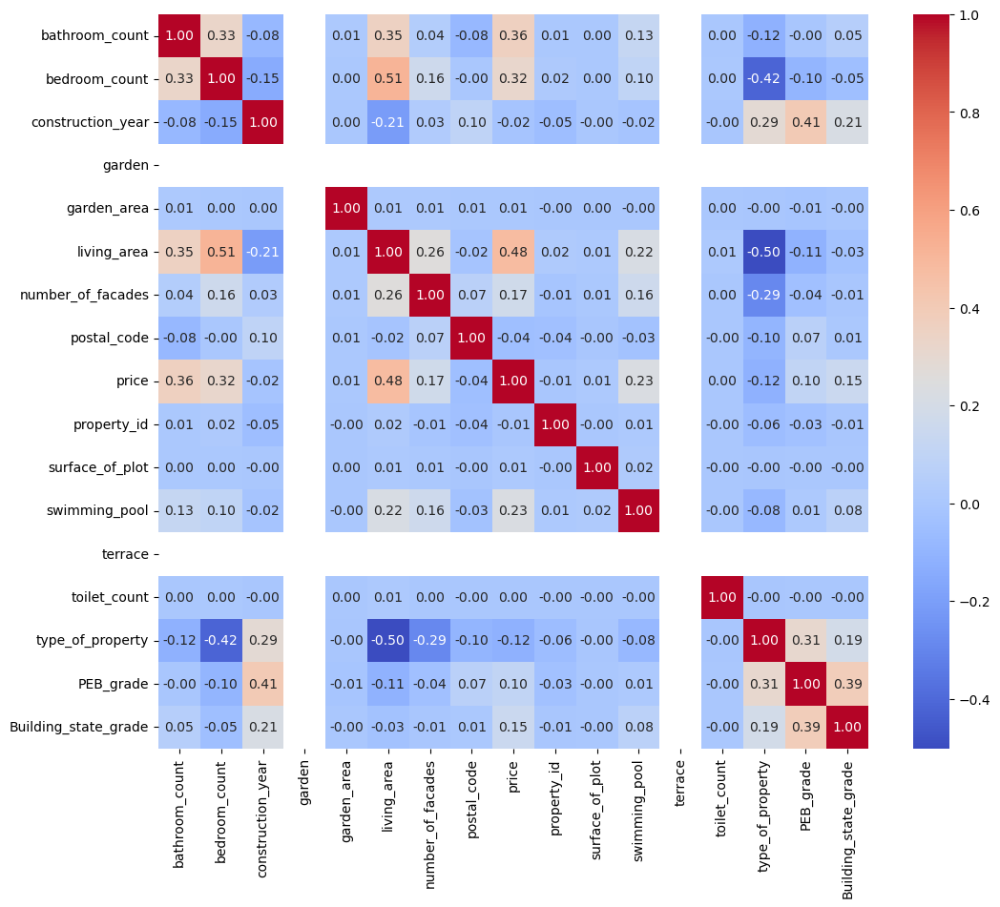

In [5]:
numeric_columns = df.select_dtypes(include=['float64', 'int64'])

# Korelasyon matrisini hesaplayalım
corr_matrix = numeric_columns.corr(method='pearson')

# Korelasyon matrisini heatmap olarak görselleştirelim
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

In [6]:
mean_of_all_price = df.groupby(['district']).mean(int)['price'].sort_values(ascending=False)

mean_of_all_sqm = df.groupby(['district']).mean(int)['living_area'].sort_values()


pricesqm = mean_of_all_price / mean_of_all_sqm 

pricesqm



district
Aalst                2229.538119
Antwerp              3016.272437
Arlon                2298.138001
Ath                  1803.091577
Bastogne             2001.987705
Brugge               5992.736785
Brussels             3645.413627
Charleroi            1395.434333
Dendermonde          2327.546600
Diksmuide            2144.944714
Dinant               1694.286781
Eeklo                2327.176964
Gent                 3010.025099
Halle-Vilvoorde      2801.193293
Hasselt              2352.966074
Huy                  1735.391893
Ieper                1978.295262
Kortrijk             2225.661203
Leuven               2831.142629
Liège                2039.934448
Maaseik              2174.712973
Marche-en-Famenne    1984.948683
Mechelen             2711.870346
Mons                 1571.303781
Mouscron             1775.972906
Namur                2327.729306
Neufchâteau          1673.267991
Nivelles             2768.442426
Oostend              2966.680608
Oudenaarde           2142.002822
P

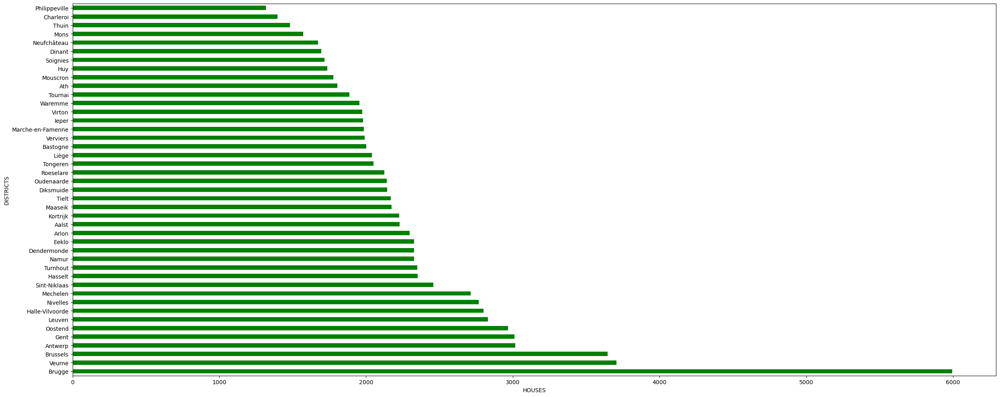

In [7]:
a = pricesqm.sort_values(ascending=False)




plt.figure(figsize=(25, 10))  
a.plot(kind='barh', color='green')
plt.xlabel('HOUSES') 
plt.ylabel('DISTRICTS') 
plt.tight_layout()
plt.show()



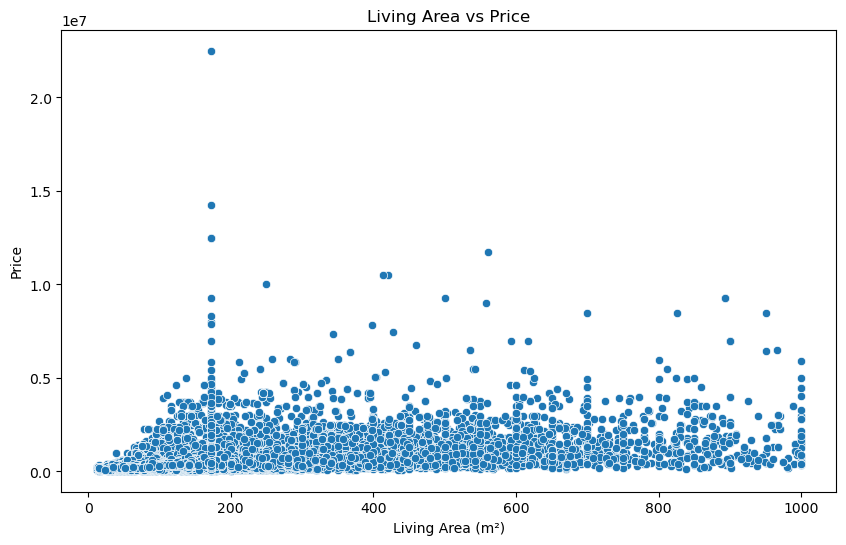

In [10]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='living_area', y='price', data=df)
plt.title('Living Area vs Price')
plt.xlabel('Living Area (m²)')
plt.ylabel('Price')
plt.show()


In [11]:
fig = px.box(df, x='province', y='price', title='Average Price by Province')
fig.show()


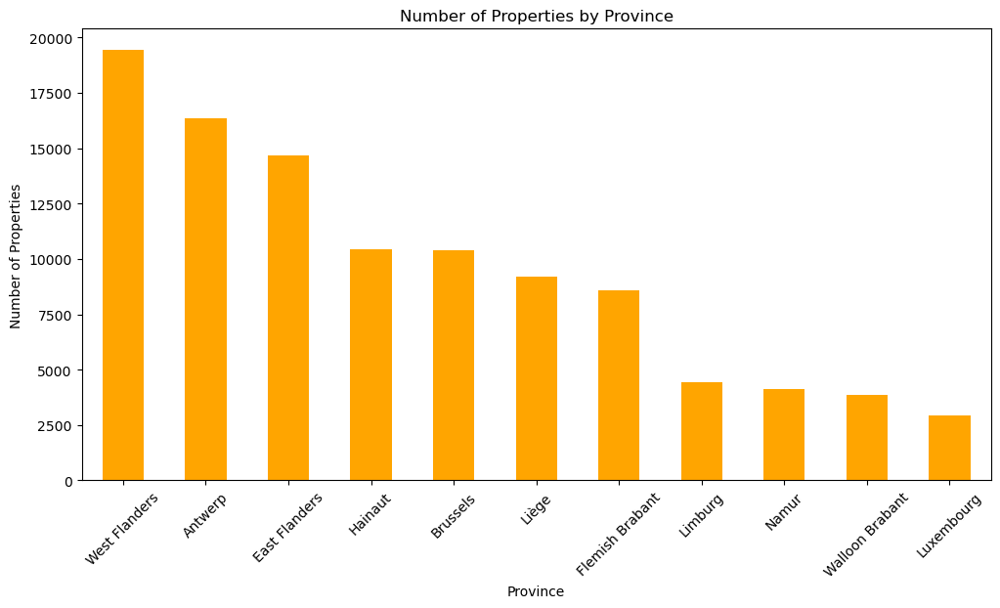

In [12]:
plt.figure(figsize=(12, 6))
df['province'].value_counts().plot(kind='bar', color='orange')
plt.title('Number of Properties by Province')
plt.xlabel('Province')
plt.ylabel('Number of Properties')
plt.xticks(rotation=45)
plt.show()


In [15]:
fig = px.histogram(df, x='price', nbins=50, title='Price Distribution')
fig.show()


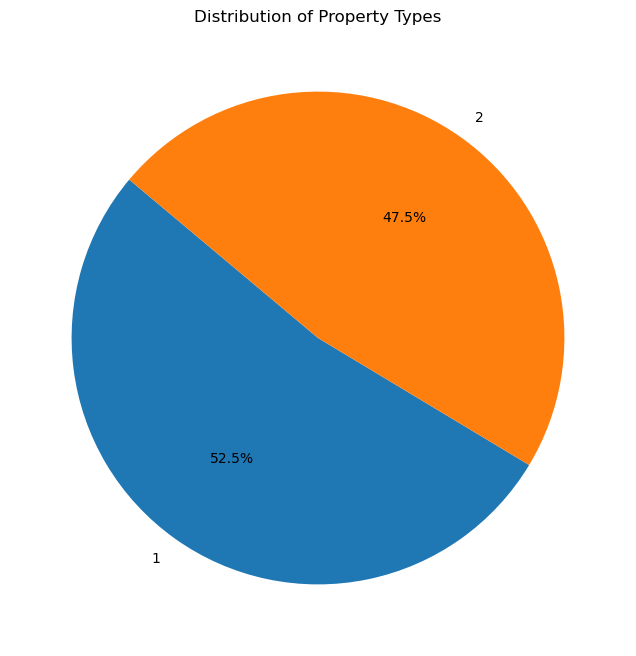

In [16]:
plt.figure(figsize=(8, 8))
df['type_of_property'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Property Types')
plt.ylabel('')
plt.show()


In [17]:
fig = px.scatter(df, x='living_area', y='price', color='province', title='Living Area vs Price')
fig.show()

In [18]:
fig = px.box(df, x='bedroom_count', y='price', title='Price Distribution by Bedroom Count')
fig.show()


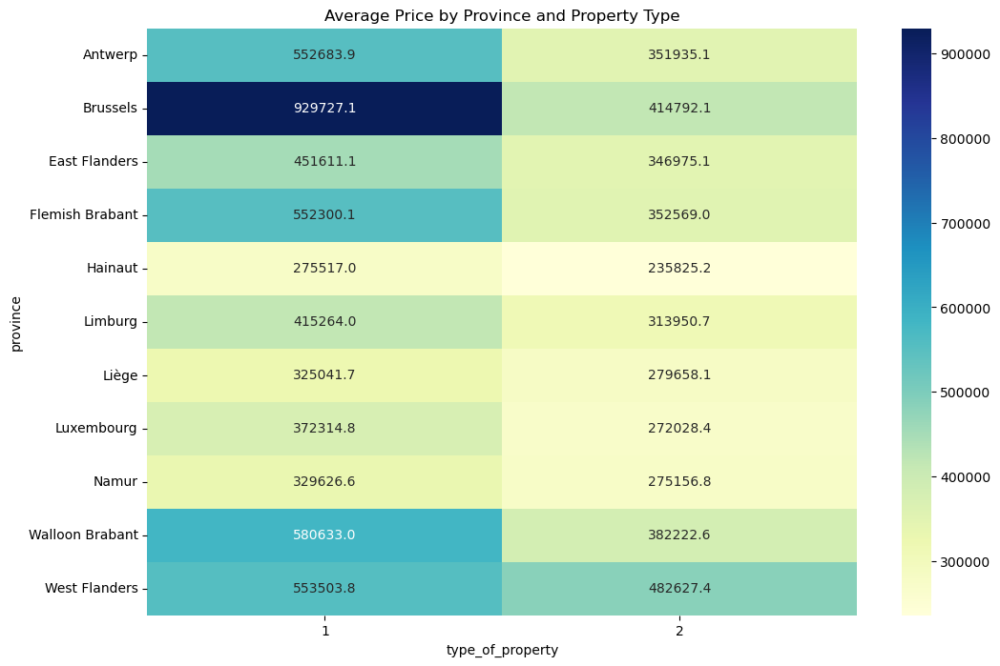

In [19]:
plt.figure(figsize=(12, 8))
pivot_table = df.pivot_table(values='price', index='province', columns='type_of_property', aggfunc='mean')
sns.heatmap(pivot_table, annot=True, fmt=".1f", cmap='YlGnBu')
plt.title('Average Price by Province and Property Type')
plt.show()


           province          price  bedroom_count  surface_of_plot
0           Antwerp  447340.839931       2.716882       653.176528
1          Brussels  536695.705882       2.546424       157.731353
2     East Flanders  412620.245062       2.843822       576.798597
3   Flemish Brabant  474254.721640       2.894829       717.349406
4           Hainaut  263511.196566       2.859747       698.077897
5           Limburg  371974.537768       2.744532       966.239008
6             Liège  305887.319835       2.893207       579.041258
7        Luxembourg  335899.897716       3.112854      1555.368565
8             Namur  306083.083837       2.832085      1468.167673
9   Walloon Brabant  506319.440916       3.144977     31092.677512
10    West Flanders  513236.550425       2.565817       385.542342


/var/folders/t9/cltb_c81611c4r7kp6n_lhhr0000gn/T/ipykernel_1999/3198214570.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




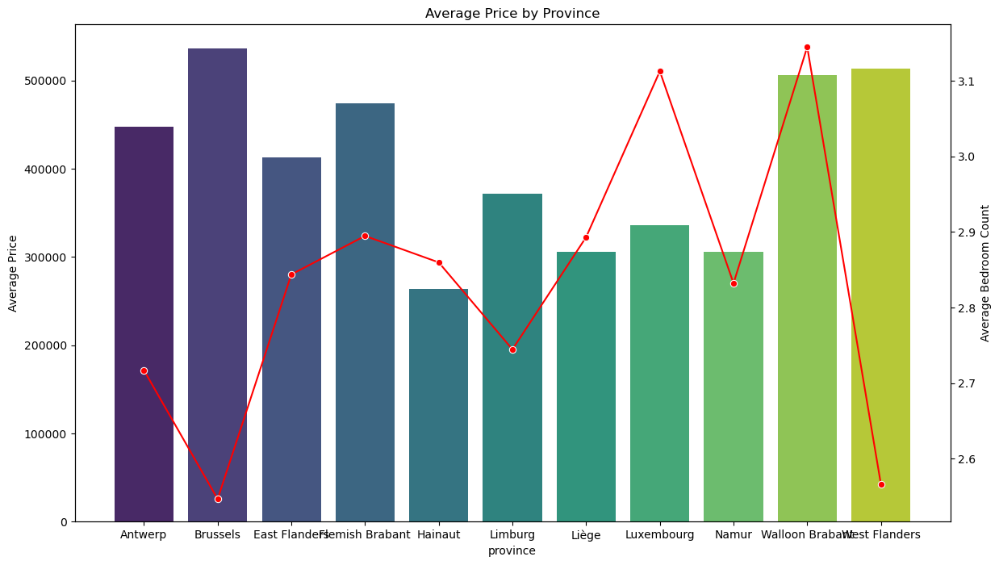

In [20]:
grouped_df = df.groupby('province').agg({
    'price': 'mean',
    'bedroom_count': 'mean',
    'surface_of_plot': 'mean'
}).reset_index()

print(grouped_df)

# Plot
fig, ax1 = plt.subplots(figsize=(14, 8))

sns.barplot(x='province', y='price', data=grouped_df, ax=ax1, palette='viridis')
ax1.set_title('Average Price by Province')
ax1.set_ylabel('Average Price')

ax2 = ax1.twinx()
sns.lineplot(x='province', y='bedroom_count', data=grouped_df, ax=ax2, color='red', marker='o')
ax2.set_ylabel('Average Bedroom Count')

plt.show()


In [21]:
mean_of_all_price = df.groupby(['district']).mean(int)['price'].sort_values(ascending=False)

mean_of_all_sqm = df.groupby(['district']).mean(int)['living_area'].sort_values()


pricesqm = mean_of_all_price / mean_of_all_sqm 

pricesqm.sort_values(ascending=False).head()



district
Brugge      5992.736785
Veurne      3705.880931
Brussels    3645.413627
Antwerp     3016.272437
Gent        3010.025099
dtype: float64